# Train a model on focal recordings plus non focal
The previous approach of using all focal recordings for the positive class ended up producing a model with high precision - each of the detections it returned was of the target species - but it also missed half of the positive examples in the validation set. Changing the threshold didn't affect the precision and recall. 


# Model training log
This notebook has been run a few times, with different number of epochs and amounts of training data.

The results are all logged to weights and biases, and the corresponding models saved to file, but a note of the confusion matrix at threshold = 0.5 is saved here to provide continuity.

The model name is the same as the wandb run name which trained that model - it is possible to rename each run, but i've found it easier to stick with the generated ones.

__Run 0: stoic-planet-192__

The present class in the trainig set was replaced entirely by the most focal examples as found by an earlier model, and then verified manually. 1000 samples per class, 10 epochs. <br>

[TN: 397,   FP:3]<br>
[FN: 186, TP:214]

![Run 0 Confusion Matrix](Images/run_0_confusion_matrix.png)

__Run 1: clear-resonance-193__

500 of the present samples in the training set were replaced with focal present samples for a total of 1000 samples per class. This was a slight improvement in recall as shown by the increased true positives and reduced false negatives. 10 epochs.

[TN: 395,   FP:5]<br>
[FN: 96, TP:304]

__Run 2: celestial-star-196__. Same as run 1 but train for 20 epochs. There is a significant increase in recall, and a slight reduction in precision. 

[TN: 393,   FP:7]<br>
[FN: 45, TP:355]

__Run 3: gentle-cherry-198__  Use the balanced training set, and add 1000 extra focal samples, and 1000 extra samples from outside of the habitat of the target species for a Total 2000 of samples per class. 10 epochs. This model is fairly similar to the previous run. The best epoch was epoch 9 so it looks as though we can squeeze out some more performance here by training for longer. 

[TN: 396,   FP:1]<br>
[FN: 40, TP:360]

__Run 4: ancient-frog-200__  Same as run 3 but for 20 epochs.

[TN: 396,   FP:4]<br>
[FN: 31, TP:369]

### Observations:
- Training with only clear focal samples produced a model which has high precision and low recall compared with 

# Use the balanced training set, and add 1000 extra focal samples, and 1000 extra samples from outside of the habitat of the target species

The previous model was trained with 1000 focal. To make sure that any changes in performance aren't due to differences in training set size, we'll keep the same number of examples per class initially, and increase the sample size once we've decided on the best source of training sample. 

In [13]:
wandb_description = "Model trained on a mixed dataset of 1000 human labelled present, 2000 human labelled absent, 1000 focal present, and 1000 out of habitat absent samples. 20 epochs."

In [2]:
# !pip install wandb
# ! pip install wandb --upgrade

In [3]:
# imports
import wandb
from pathlib import Path
import sys
import pandas as pd
BASE_PATH = Path.cwd().parent.parent
sys.path.append(str(BASE_PATH))
import opensoundscape as opso
from opensoundscape.preprocess.utils import show_tensor, show_tensor_grid
import numpy as np
model_save_path = BASE_PATH / 'models'
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from ipywidgets import interact
from src.utils import show_sample_from_df, show_samples_in_df, inspect_input_samples, get_binary_targets_scores, suppress_warnings_if_main_branch, clean_confidence_cats, plot_metrics_across_thresholds, log_single_metric_to_wandb, verify_samples, clean_confidence_cats

/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/opensoundscape/ml/cnn.py:18: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [4]:
suppress_warnings_if_main_branch()

%load_ext autoreload
%autoreload 2

In [5]:
# If training on a Mac:
%env PYTORCH_ENABLE_MPS_FALLBACK 0

env: PYTORCH_ENABLE_MPS_FALLBACK=0


# Set some hyperparameters

In [6]:
random_seed = 42
learning_rate = 0.001
epochs=40

# Load the data

In [7]:
# load training and validation dataframes
data_path = Path.cwd().parent.parent / "data"
train_df = pd.read_pickle(data_path / "interim" / "train_set" / "balanced_train_set_verified.pkl")
valid_df = pd.read_pickle(data_path / "interim" / "valid_set" / "balanced_valid_set_verified.pkl")

# Re-label mis labelled samples and throw out ambiguous ones. 
train_df = clean_confidence_cats(train_df)

# Load more focal samples
train_focal = pd.read_pickle(data_path / "interim" / "train_set" / "train_focal.pkl")
train_focal = clean_confidence_cats(train_focal)

other_habitat_absent = pd.read_pickle(data_path / "interim" / "train_set" / "other_habitat_train.pkl")

In [8]:
# Load more examples of the negative class. 
train_df_full = pd.read_pickle(data_path / "interim" / "train_set" / "train_set_verified.pkl")
absent_df = train_df_full.loc[train_df_full.target_present == 0]
absent_df = clean_confidence_cats(absent_df)
absent_df = absent_df.loc[~absent_df.index.isin(train_df.index)]
absent_df = absent_df.loc[absent_df.confidence_cat == 3]
absent_df = absent_df.sample(n=1000, random_state=random_seed)

In [9]:
# Choose 1000 focal samples not already in training set. 
focal = train_focal.loc[~train_focal.index.isin(train_df.index)]
focal.confidence_cat.value_counts()

confidence_cat
4     980
3     780
33      2
6       1
Name: count, dtype: int64

In [10]:
focal_800 = focal.loc[focal.confidence_cat == 4.0].sample(980, random_state = random_seed)
focal_200 = focal.loc[focal.confidence_cat == 3.0].sample(20, random_state = random_seed)
focal_1000 = pd.concat([focal_800, focal_200])

train_df = pd.concat([train_df, focal_1000, other_habitat_absent, absent_df])
train_df.target_present.value_counts()

target_present
0.0    2980
1.0    2010
Name: count, dtype: int64

### Dataset (ds): PyTorch lingo for a pairing of the inputs with the targets.
The only feature needed for training alongside the input spectrogram is the present / absent label. So we can drop the remaining columns from the dataframe to make things neater. 

In [11]:
# Shuffle the training set
train_ds = train_df[['target_present']].sample(frac=1, random_state=random_seed)
valid_ds = valid_df[['target_present']]
train_ds.head()

,,,target_present
file,start_time,end_time,
../../data/raw/recordings/OSFL/recording-622383.flac,64.5,67.5,0.0
../../data/raw/recordings/OSFL/recording-291772.mp3,73.5,76.5,1.0
../../data/raw/recordings/OSFL_other_habitats/recording-614831.flac,424.5,427.5,0.0
../../data/raw/recordings/OSFL/recording-391050.flac,7.5,10.5,0.0
../../data/raw/recordings/OSFL_other_habitats/recording-44762.mp3,156.0,159.0,0.0


# Define a model architecture to train. 

In [14]:
# Create a CNN object designed to recognize 3-second samples
from opensoundscape import CNN

# Use resnet18 (faster) or resnet34 architecture
architecture = 'resnet34'

# Can use this code to get your classes, if needed
class_list = list(train_ds.columns)

model = CNN(
    architecture = architecture,
    classes = class_list,
    sample_duration=3,
    
)

# Single target means that a clip can have only one positive label at a time. For multi class problems this could be set to true or false depending on whether there are multiple simultaneous labels. For binary problem it can be set to false to enable sigmoid activation at the final layer. 
model.single_target = False
model.optimizer_params['lr'] = learning_rate

model.classes

['target_present']

Look at some samples from the database.

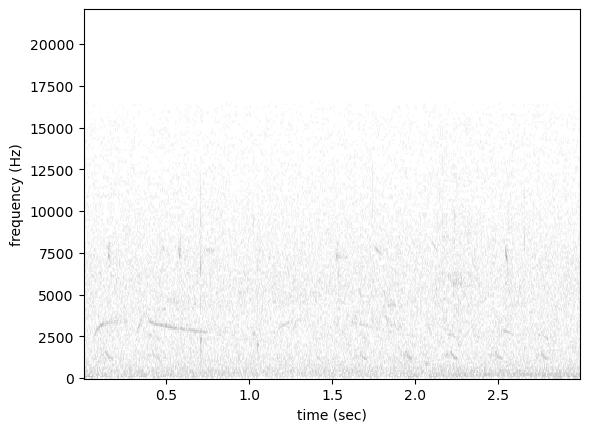

In [15]:
# ctrl + enter to cycle through samples from the dataset. Choose present or absent. 
show_sample_from_df(train_ds, label='present')

In [16]:
# Make sure you're using the GPU - it should say 'cuda' if you are on a pc and 'mps' on a mac. 
print(f'model.device is: {model.device}')

model.device is: mps


# Weights & Biases initialization
Weights and biases is used to track the progress during model training, and to compare different models with one-another. 

In [17]:
# Passing in the name of the current notebook here.
%set_env WANDB_NOTEBOOK_NAME={Path.cwd()}/10-train-a-model-using-mixture-of-focal-and-non-focal.ipynb

wandb.login()

wandb_session = wandb.init(

    project='OSFL',
    notes=wandb_description,
    config={
    "epochs":epochs,
    "random_seed": random_seed}
)
wandb.config.learning_rate = learning_rate

env: WANDB_NOTEBOOK_NAME=/Users/mikeg/code/machine_learning/osfl_cnn_recognizer/notebooks/model_development_walkthrough/10-train-a-model-using-mixture-of-focal-and-non-focal.ipynb


wandb: Currently logged in as: mgallimore88. Use `wandb login --relogin` to force relogin
/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/wandb/sdk/lib/ipython.py:77: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import HTML, display  # type: ignore


# Show training examples at model input
The image augmentations are turned off, but can be turned on again by setting bypass_augmentations to False. 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

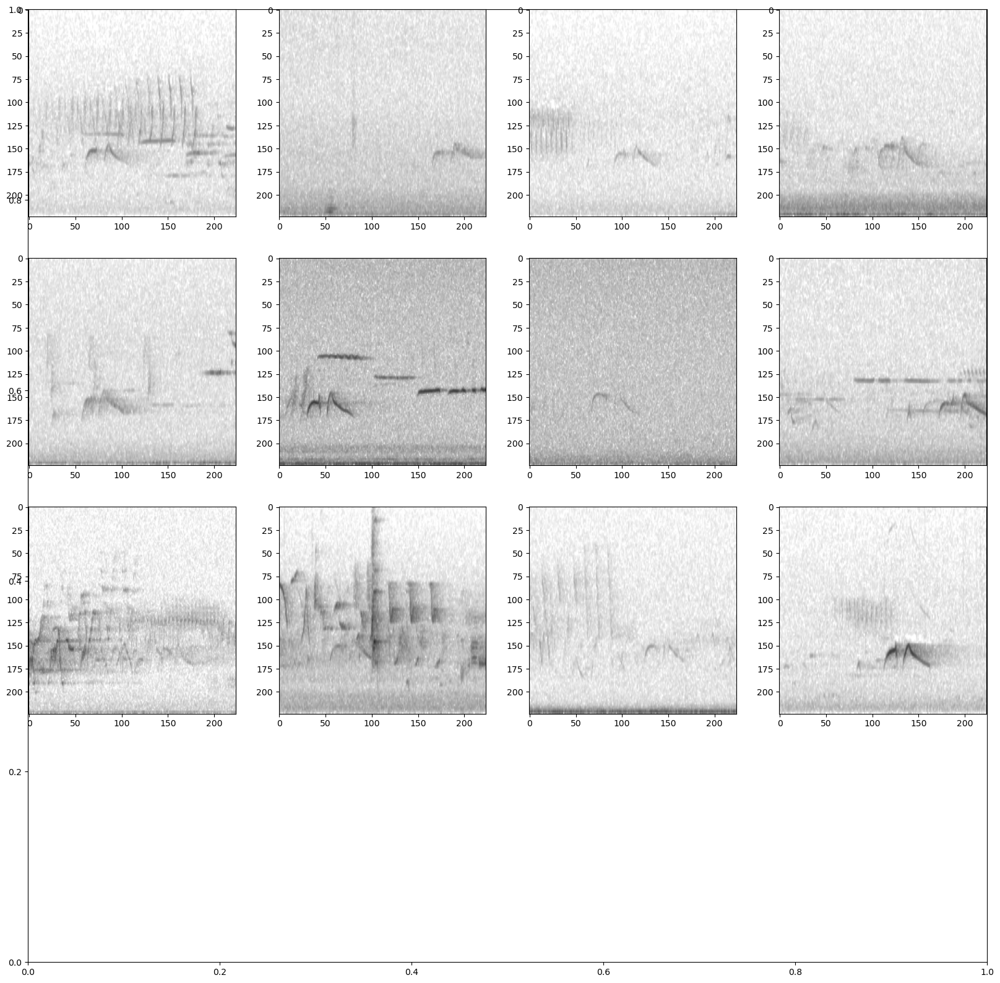

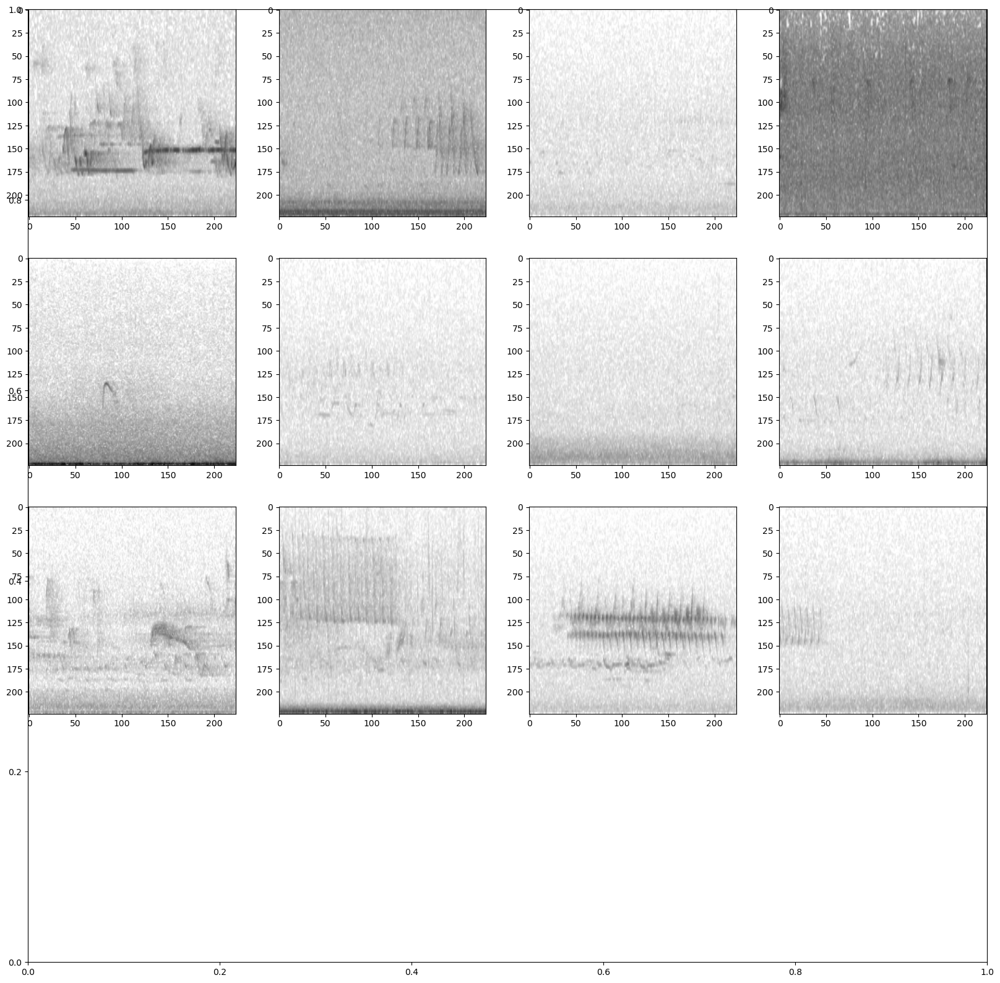

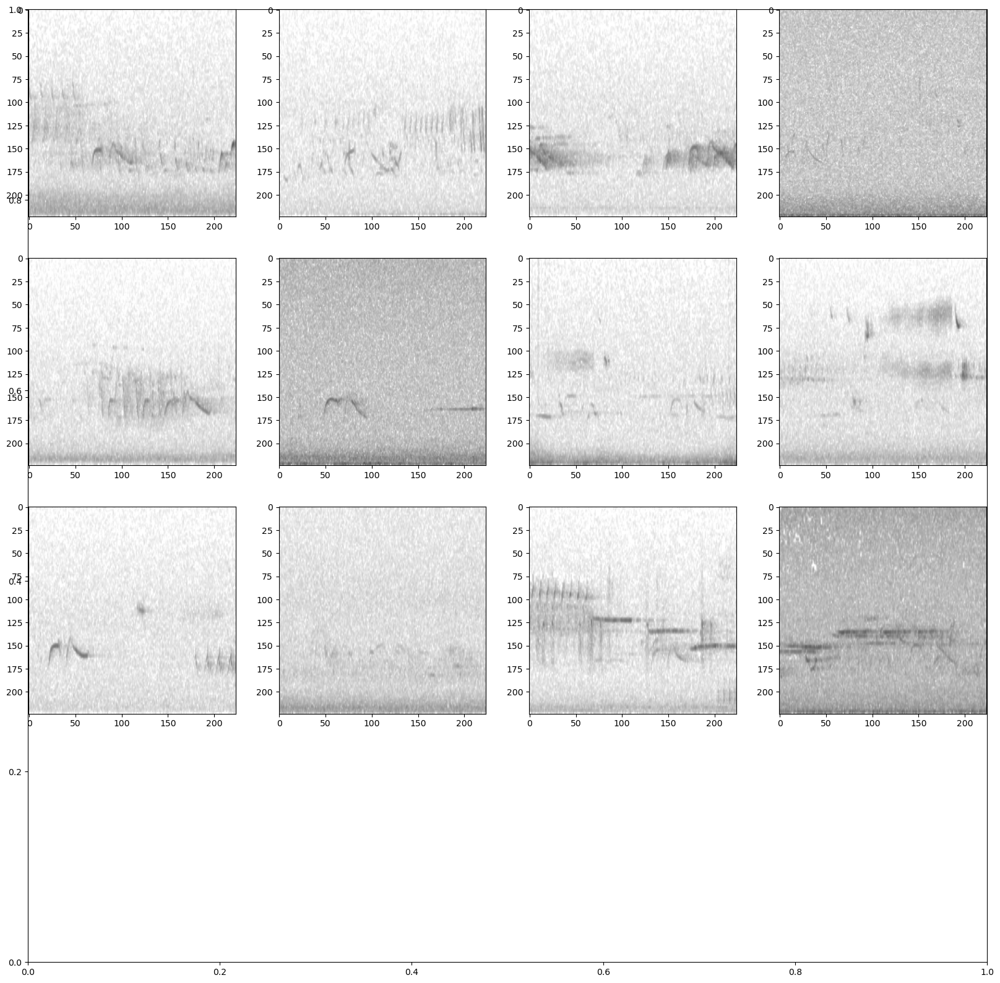

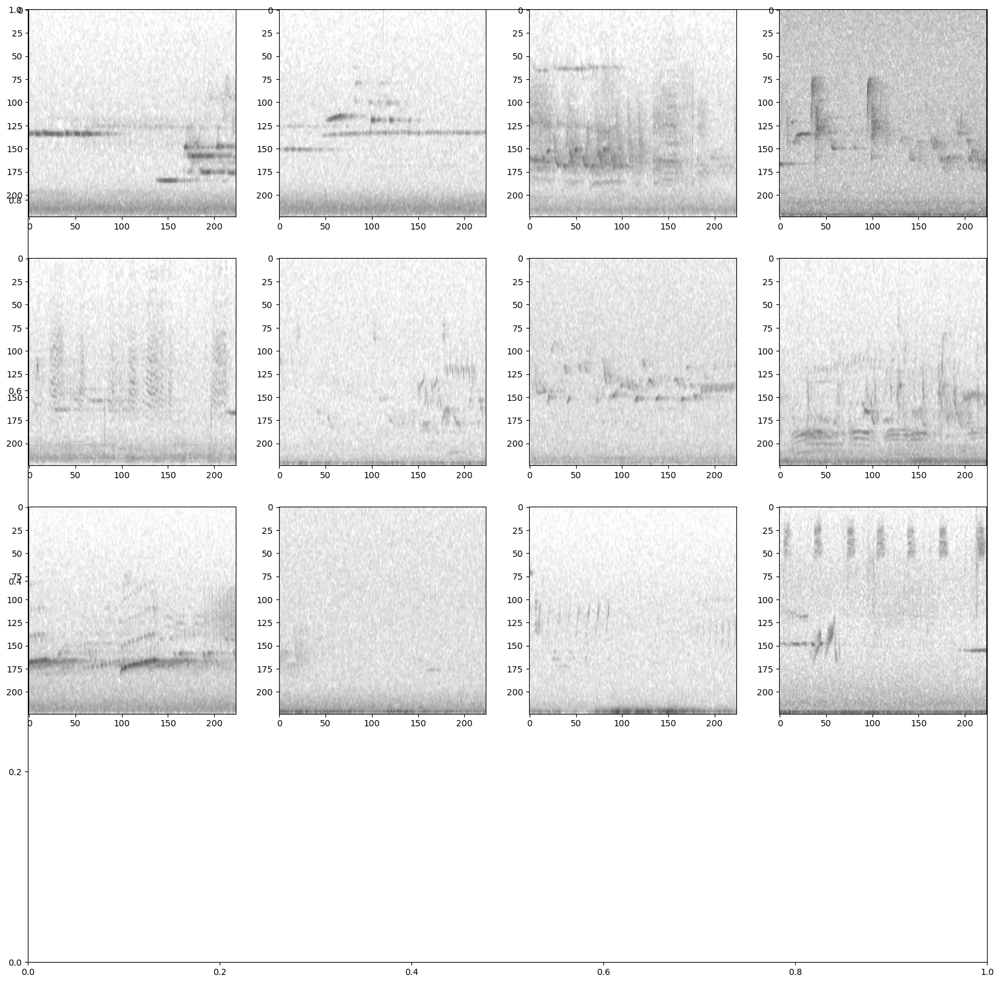

In [18]:
inspect_input_samples(train_ds, valid_ds, model, bypass_augmentations=True)

# Train the model

In [19]:
# Train the model
model.train(
    train_ds,
    valid_ds,
    epochs = epochs,
    batch_size = 64,
    num_workers = 0, # parallelized cpu tasks for preprocessing. Reduce if dataloader quits unexpectedly. 
    log_interval = 100,
    save_interval = 10,
    save_path=model_save_path,
    invalid_samples_log="./invalid_samples.log",
    wandb_session = wandb_session,
    )


Training Epoch 0


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 0 [batch 0/78, 0.00%] 
	DistLoss: 0.650
Metrics:
Metrics:
	MAP: 0.544

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.648

Training Epoch 1


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 1 [batch 0/78, 0.00%] 
	DistLoss: 0.584
Metrics:
Metrics:
	MAP: 0.776

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.878

Training Epoch 2


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 2 [batch 0/78, 0.00%] 
	DistLoss: 0.523
Metrics:
Metrics:
	MAP: 0.861

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.937

Training Epoch 3


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 3 [batch 0/78, 0.00%] 
	DistLoss: 0.376
Metrics:
Metrics:
	MAP: 0.899

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.964

Training Epoch 4


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 4 [batch 0/78, 0.00%] 
	DistLoss: 0.321
Metrics:
Metrics:
	MAP: 0.913

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.961

Training Epoch 5


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 5 [batch 0/78, 0.00%] 
	DistLoss: 0.272
Metrics:
Metrics:
	MAP: 0.926

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.977

Training Epoch 6


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 6 [batch 0/78, 0.00%] 
	DistLoss: 0.418
Metrics:
Metrics:
	MAP: 0.934

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.978

Training Epoch 7


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 7 [batch 0/78, 0.00%] 
	DistLoss: 0.284
Metrics:
Metrics:
	MAP: 0.942

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.983

Training Epoch 8


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 8 [batch 0/78, 0.00%] 
	DistLoss: 0.216
Metrics:
Metrics:
	MAP: 0.948

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.987

Training Epoch 9


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 9 [batch 0/78, 0.00%] 
	DistLoss: 0.370
Metrics:
Metrics:
	MAP: 0.946

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.988

Training Epoch 10


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 10 [batch 0/78, 0.00%] 
	DistLoss: 0.172
Metrics:
Metrics:
	MAP: 0.949

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.989

Training Epoch 11


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 11 [batch 0/78, 0.00%] 
	DistLoss: 0.376
Metrics:
Metrics:
	MAP: 0.955

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.991

Training Epoch 12


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 12 [batch 0/78, 0.00%] 
	DistLoss: 0.307
Metrics:
Metrics:
	MAP: 0.955

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.993

Training Epoch 13


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 13 [batch 0/78, 0.00%] 
	DistLoss: 0.303
Metrics:
Metrics:
	MAP: 0.958

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.991

Training Epoch 14


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 14 [batch 0/78, 0.00%] 
	DistLoss: 0.235
Metrics:
Metrics:
	MAP: 0.959

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.989

Training Epoch 15


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 15 [batch 0/78, 0.00%] 
	DistLoss: 0.205
Metrics:
Metrics:
	MAP: 0.962

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.988

Training Epoch 16


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 16 [batch 0/78, 0.00%] 
	DistLoss: 0.319
Metrics:
Metrics:
	MAP: 0.956

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.993

Training Epoch 17


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 17 [batch 0/78, 0.00%] 
	DistLoss: 0.196
Metrics:
Metrics:
	MAP: 0.964

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.992

Training Epoch 18


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 18 [batch 0/78, 0.00%] 
	DistLoss: 0.325
Metrics:
Metrics:
	MAP: 0.966

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.992

Training Epoch 19


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 19 [batch 0/78, 0.00%] 
	DistLoss: 0.350
Metrics:
Metrics:
	MAP: 0.965

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.992

Training Epoch 20


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 20 [batch 0/78, 0.00%] 
	DistLoss: 0.202
Metrics:
Metrics:
	MAP: 0.964

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.990

Training Epoch 21


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 21 [batch 0/78, 0.00%] 
	DistLoss: 0.212
Metrics:
Metrics:
	MAP: 0.967

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.995

Training Epoch 22


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 22 [batch 0/78, 0.00%] 
	DistLoss: 0.227
Metrics:
Metrics:
	MAP: 0.963

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.993

Training Epoch 23


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 23 [batch 0/78, 0.00%] 
	DistLoss: 0.231
Metrics:
Metrics:
	MAP: 0.970

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.993

Training Epoch 24


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 24 [batch 0/78, 0.00%] 
	DistLoss: 0.286
Metrics:
Metrics:
	MAP: 0.970

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.993

Training Epoch 25


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 25 [batch 0/78, 0.00%] 
	DistLoss: 0.149
Metrics:
Metrics:
	MAP: 0.969

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.992

Training Epoch 26


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 26 [batch 0/78, 0.00%] 
	DistLoss: 0.113
Metrics:
Metrics:
	MAP: 0.970

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.993

Training Epoch 27


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 27 [batch 0/78, 0.00%] 
	DistLoss: 0.141
Metrics:
Metrics:
	MAP: 0.970

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.993

Training Epoch 28


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 28 [batch 0/78, 0.00%] 
	DistLoss: 0.180
Metrics:
Metrics:
	MAP: 0.970

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.992

Training Epoch 29


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 29 [batch 0/78, 0.00%] 
	DistLoss: 0.093
Metrics:
Metrics:
	MAP: 0.973

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.991

Training Epoch 30


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 30 [batch 0/78, 0.00%] 
	DistLoss: 0.113
Metrics:
Metrics:
	MAP: 0.975

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.993

Training Epoch 31


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 31 [batch 0/78, 0.00%] 
	DistLoss: 0.264
Metrics:
Metrics:
	MAP: 0.971

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.992

Training Epoch 32


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 32 [batch 0/78, 0.00%] 
	DistLoss: 0.155
Metrics:
Metrics:
	MAP: 0.976

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.991

Training Epoch 33


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 33 [batch 0/78, 0.00%] 
	DistLoss: 0.120
Metrics:
Metrics:
	MAP: 0.973

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.993

Training Epoch 34


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 34 [batch 0/78, 0.00%] 
	DistLoss: 0.156
Metrics:
Metrics:
	MAP: 0.977

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.992

Training Epoch 35


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 35 [batch 0/78, 0.00%] 
	DistLoss: 0.227
Metrics:
Metrics:
	MAP: 0.976

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.993

Training Epoch 36


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 36 [batch 0/78, 0.00%] 
	DistLoss: 0.141
Metrics:
Metrics:
	MAP: 0.975

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.992

Training Epoch 37


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 37 [batch 0/78, 0.00%] 
	DistLoss: 0.133
Metrics:
Metrics:
	MAP: 0.978

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.991

Training Epoch 38


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 38 [batch 0/78, 0.00%] 
	DistLoss: 0.171
Metrics:
Metrics:
	MAP: 0.975

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.991

Training Epoch 39


  0%|          | 0/78 [00:00<?, ?it/s]

Epoch: 39 [batch 0/78, 0.00%] 
	DistLoss: 0.104
Metrics:
Metrics:
	MAP: 0.977

Validation.


  0%|          | 0/13 [00:00<?, ?it/s]

Metrics:
	MAP: 0.992

Best Model Appears at Epoch 21 with Validation score 0.995.


# If you get an error saying sample is shorter than expected duration:
If this error is causing training to stall one workaround is to add the following three lines of code to the opensoundscape/audio.py just after the code that prints the error message:



``` python3
error_log = (f"Path: {path}, start_time: {offset} sec, end_time {offset + duration} sec.")
with open ("short_samples.log", "a") as log:
    log.write(f"{error_log}\n")
```

The short samples causing the warning can be removed using
``` python3
remove_short_clips(train_ds)
```

# Plot confusion matrix

In [34]:
model = opso.load_model(model_save_path / "best.model")

In [35]:
predictions = model.predict(valid_ds, batch_size=64, num_workers=0, activation_layer='sigmoid')

  0%|          | 0/13 [00:00<?, ?it/s]

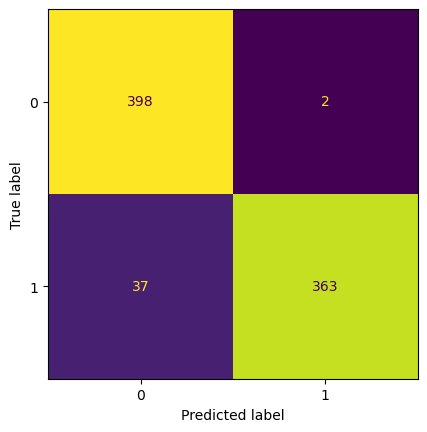

interactive(children=(FloatSlider(value=0.5, description='threshold', max=1.0, step=0.01), Output()), _dom_cla…

<function __main__.plot_confusion_matrix(threshold=0.5)>

In [36]:
def plot_confusion_matrix(threshold=0.5):
    preds, targets, scores = get_binary_targets_scores(valid_df, predictions, threshold)
    # plot confusion matrix
    cm = confusion_matrix(targets, preds)
    _ = ConfusionMatrixDisplay(cm).plot(colorbar=False)
    return cm
cm = plot_confusion_matrix(threshold=0.5)
interact(plot_confusion_matrix, threshold=(0.0, 1.0, 0.01))

# Plot metrics across thresholds

/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


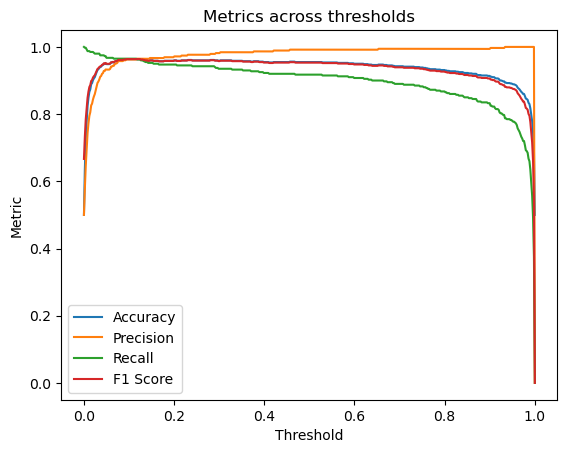

In [37]:
plot_data, legend = plot_metrics_across_thresholds(valid_df, 'predicted', 'target_present')
thresholds, accuracies, precisions, recalls, f1s = zip(*list(plot_data))

In [39]:
log_single_metric_to_wandb(accuracies, thresholds, "accuracy")
log_single_metric_to_wandb(precisions, thresholds, "precision")
log_single_metric_to_wandb(recalls, thresholds,  "recall")
log_single_metric_to_wandb(f1s, thresholds, "f1")

# View the errors
The model made some errors - let's take a look at these and see what kinds of samples lead to these errors

#### First update the prediction and loss calculation columns in the validation data

In [40]:
# replace the predicitons made with the previous model with the new predictions
valid_df['predicted'] = predictions.target_present
# Update the loss
valid_df['loss'] = abs(valid_df['target_present'] - valid_df['predicted'])

In [41]:
# Collect the errors
false_positives = valid_df.loc[valid_df.predicted >= 0.5].loc[valid_df['target_present'] == 0]
false_negatives = valid_df.loc[valid_df.predicted < 0.5].loc[valid_df['target_present'] == 1]

## Show the false positives

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


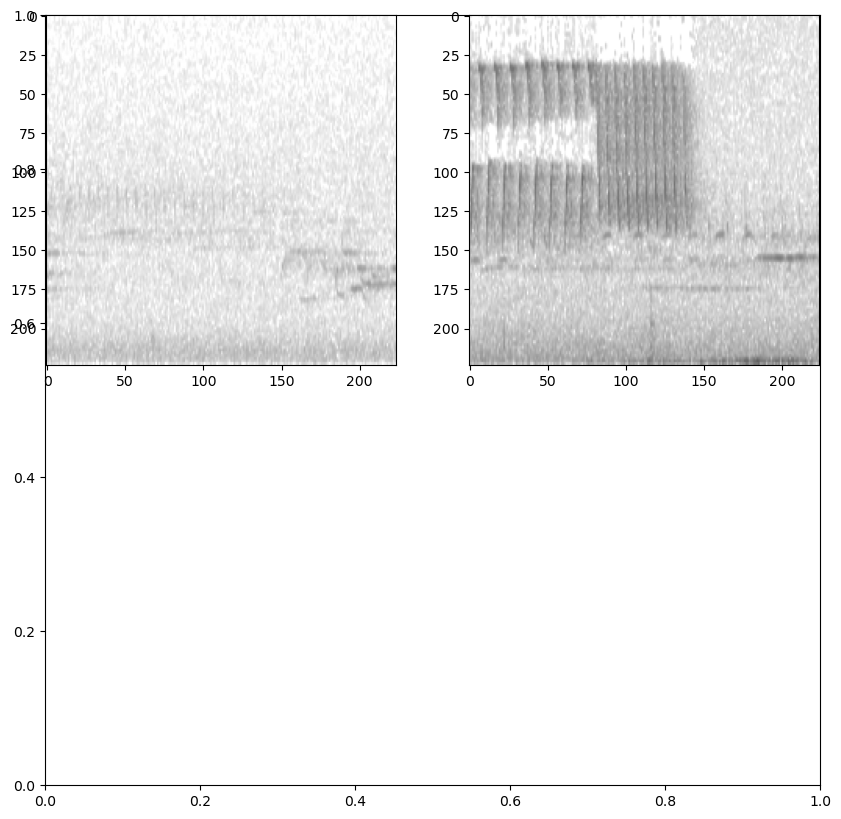

In [42]:
show_samples_in_df(false_positives, model)

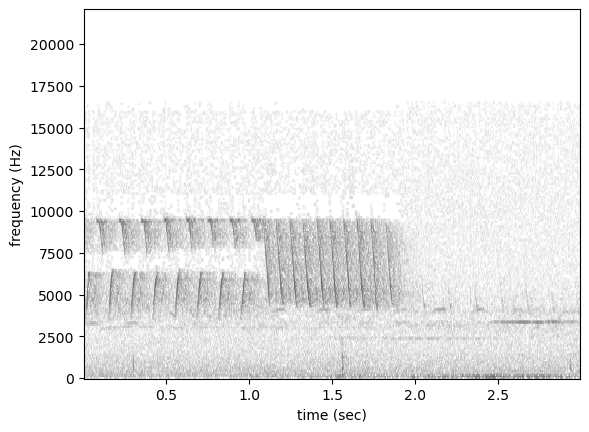

In [43]:
show_sample_from_df(false_positives, label='absent')

## Show the false negatives

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

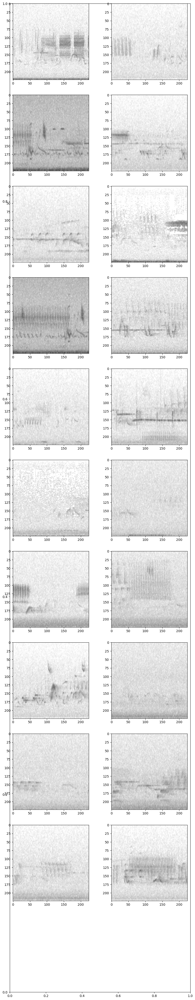

In [44]:
show_samples_in_df(false_negatives.sample(20), model)

Now's a good time to clean the validation set a little more, in case we're noticing that the false positives contain true positives or vice versa. 

In [45]:
# Reset the confidence category of the misclassified samples to 0.
valid_df.loc[false_positives.index, 'confidence_cat'] = 0
valid_df.loc[false_negatives.index, 'confidence_cat'] = 0

(PosixPath('../../data/raw/recordings/OSFL/recording-555552.flac'), 6.0, 9.0)
target = 1.0, prediction = 0.00560007244348526 loss = 0.9943999275565147


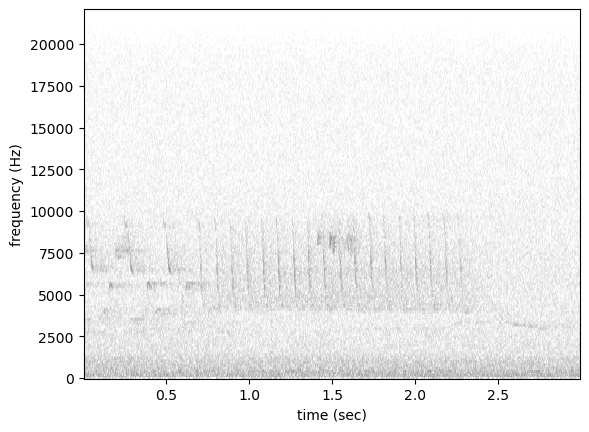

added confidence tag 0 to the dataframe.
verification counts for target_present = 1.0
confidence_cat
3    318
4     43
0     38
2      1
Name: count, dtype: int64


/Users/mikeg/code/machine_learning/osfl_cnn_recognizer/src/utils.py:455: PerformanceWarning: indexing past lexsort depth may impact performance.
  df.loc[clip_idx, "confidence_cat"] = int(user_confidence)


In [46]:
# re-check the false negatives
valid_df = verify_samples(valid_df, ground_truth=1.0, loss_sorted=True)

In [ ]:
valid_df.to_pickle(data_path / "interim" / "valid_set" / "balanced_valid_set_verified.pkl")

#### Within the false negatives
The samples were all either masked or very quiet. They were hard to notice. Some ended up being re-classified as category 2: unsure. 

In [ ]:
# re-check the false positives
valid_df = verify_samples(valid_df, ground_truth=0.0, loss_sorted=True)

No unverified clips within chosen target class.


## Weights & Biases makes a memorable name for each model training run.

In [31]:
wandb.run.name

'serene-sea-201'

# Save the model under this name

In [50]:
model.save(model_save_path / f"{wandb.run.name}.model")

# End the weights and biases session 

In [33]:
wandb.finish()

/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/wandb/sdk/lib/ipython.py:89: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display


/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/wandb/sdk/lib/ipython.py:77: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import HTML, display  # type: ignore


epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
loss,█▆▅▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,39
loss,0.16373


This experiment shows that by only including focal samples in training, we can train a model which has high precision but poor recall. Adding more variety into the training set improves the recall without much effect on precision. Doubling the number of samples in the training data, and doubling the number of training cycles from 10 to 20 both improved performance metrics by a similar degree. 